In [28]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
from IPython.display import Image
import pickle
import plotly.io as pio

## Data 

### CO2 emission data -> 
https://app.electricitymaps.com/map
### Loading temperature records in Montreal -> 
CANADA Environment and natural resources https://climate.weather.gc.ca
### Wholesale market price for HQ -> 
https://www.nyiso.com/custom-reports
### Consumption data -> 
Sartori, Igor, et al. "Sub-hourly measurement datasets from 6 real buildings: Energy use and indoor climate." Data in Brief 48 (2023): 109149.
### HVAC configuration ->
Brainbox AI

## Modeling

This study introduces a mathematical model aimed at optimizing electricity consumption in a group of commercial buildings. The buildings' consumption is categorized into three distinct groups: HVAC consumption, which accounts for the energy used for heating or cooling the buildings; adjustable loads, such as lighting, that are reducible; and non-controllable loads, like TVs, refrigerators, and security and alarm services. In addition to minimizing electricity costs, the model considers two other objectives: minimizing consumer dissatisfaction due to reductions in consumption or deviations from the desired temperature, and providing peak load shaving and load reduction during peak hours.

The planning horizon for this model is weekly, and it employs a simplified version of HVAC systems that operate in on and off states. Temperature dynamics within the buildings are modeled using thermal capacitance ($C_i$), thermal resistance ($R_i$), and HVAC power rating ($h_i$). Specifically, thermal capacitance represents the ability of the building to store heat, thermal resistance indicates the building's insulation effectiveness, and HVAC power rating defines the rate at which the HVAC system can change the indoor temperature.

The model utilizes real consumption data from the Varennes Library, located at Concordia University in Varennes, Quebec, Canada. The grid situation in Quebec, where the grid operator aims to minimize electricity consumption and peak loads during morning (6-9 AM) and evening (4-8 PM) periods, is considered.\footnote{\url{https://www.hydroquebec.com/residential/customer-space/rates/winter-credit-option.html}}

add: desirable temperature is 22 during working hours and 18 during non working hours. and there is linear transition between these numbers. say timesteps are 5-minutes

### Indexes and Parameters

The models in this study use two indexes for time steps (peak and off-peak periods) and buildings:

\begin{align*}
    i \in& \{\mathcal{N}\} && \text{ building } i \text{ in the targeted group of buildings }\\
    t \in& \{\mathcal{T}\} && \text{ episode } t \text{ in horizon } [1,2,3,...,T]\\
    t \in& \{\mathcal{H}\} && \text{ episode } t \text{ in peak period, } (\mathcal{H} \subset \mathcal{T})
\end{align*}
Below is the list of parameters:

\begin{align*}
    C_{i} \doteq & \text{ Thermal capacitance of building $i$ (kW/$^{\circ}$C) } \\
    R_{i} \doteq & \text{ Thermal resistance of building $i$ ($^{\circ}$C/kW)} \\
    h_{i} \doteq & \text{ HVAC power rating at building $i$ (kW)} \\
    T_{i,t}^{des}  \doteq & \text{ Desired indoor temperature in building $i$ at time } t \text{ } (^{\circ}C) \\
    T_{t}^{out}  \doteq & \text{ Outdoor temperature forecast at time } t \text{ }(^{\circ}C) \\
    T^{dev}  \doteq & \text{ Maximum allowable deviation from the desired temperature } (^{\circ}C) \\
    e_{i,t}^{N} \doteq & \text{ Non-controllable load of building $i$ at time }t\\
    e_{i,t}^{C} \doteq & \text{ lighting load of building $i$ at time }t\\
    P_{t} \doteq & \text{ Electricity price (\$/kWh) to buy from wholesale market at time } t \\
    \alpha_{i} \doteq & \text{ Building $i$'s discomfort weight factor for the temperature difference (\$/$^{\circ}C^2$))}\\
    \beta_{i} \doteq & \text{ Building $i$'s discomfort weight factor for the reduced power (\$/$^{\circ}C^2$)}\\
    \gamma \doteq & \text{ Weight factor (rebate rate) for the reduced load (\$/kWh)}\\
    \delta \doteq & \text{ Weight factor (Carbon tax) for the $CO_2$ emission (\$/gCO$_2$eq)}\\
    \epsilon \doteq & \text{ Total carbon intensity of electricity consumed in Quebec (gCO$_2$eq/kWh)}
\end{align*}

In this list, parameters  $T_{t}^{out}$, $P_{t}$, $e_{i,t}^{N}$ and $e_{i,t}^{C}$ are realized in real-time.


### Decision and State Variables
The decision variables below indicate the electricity flows and curtailed loads in the consumers' buildings:

\begin{align*}
    B_{i,t} \doteq& \text{ HVAC status (on/off) in consumer $i$'s building at time } t\\
    T_{i}^{in} \doteq & \text{ Indoor temperature ($^{\circ}C$) in consumer $i$'s building at time } t\\
    E_{i,t}^{N} \doteq & \text{ Realized non-controllable load (kWh) of consumer $i$ at time }t\\
    E_{i,t}^{C} \doteq & \text{ Realized controllable load (kWh) of consumer $i$ at time }t\\
    E_{t}^{B} \doteq & \text{ Total energy consumption (kWh) in the reference model at time }t
\end{align*}

### Reference Model
The reference model is introduced below to calculate the reference consumption record of the buildings when they, regardless of demand response objectives, only minimize their dissatisfaction.

\begin{align}
    \text{min} & \sum_{i,t} (T_{i,t}^{des} - T_{i,t}^{in})^2 
\end{align}

subject to:

\begin{align}
    T_{i,t}^{in} &= T_{i,t-1}^{in} + \left( \frac{T_{t}^{out}-T_{i,t-1}^{in}}{R_{i}}+B_{i,t}.h_{i}\right)\frac{\Delta t}{C_{i}} & \forall i,t \\
    |T_{i,t}^{des} - T_{i,t}^{in}| &\leq T^{dev} & \forall i,t \\
    E_{i,t}^{N} &= e_{i,t}^{N} & \forall i,t  \\
    E_{i,t}^{C} &= e_{i,t}^{C} & \forall i,t  \\
    E_{t}^{B} &= \sum_{i,j} E_{i,t}^{N} + E_{i,t}^{C} + B_{i,t}.h_{i} & \forall t \\
    0 &\leq T_{i,t}^{in}, B_{i,t}, E_{i,t}^{N}, E_{i,t}^{C}, E_{t}^{B} & \forall i,t
\end{align}

In the reference model, objective function \ref{ref_obj} keeps the indoor temperature as close as possible to the desired temperature, with no cost term included. Equation \ref{ref_T_limit} calculates the indoor temperature in the next time step. Constraints \ref{ref_NCont} and \ref{ref_Cont} ensure all load types are covered at their preferred power. Finally, Equation \ref{ref_Eb} calculates the total energy consumed at time $t$ and Equation \ref{ref_vars} indicates the decision variables' domain.

### Main Model

Once the reference model is solved and $E_{t}^{B}$ is calculated, the main model uses \(E_{t}^{B}\) as a reference point to calculate the saved and shaved peak load. The main model is presented below:

\begin{align}
\begin{split}
    \min & \sum_{i,j,t \in \mathcal{T}} P_{t} (B_{i,t} \cdot h_{i} + E_{i,t}^{N} + E_{i,t}^{C}) \\ 
    + & \sum_{i,j,t \in \mathcal{T}} \alpha_{i} (T_{i,t}^{\text{in}} - T_{i,t}^{\text{des}})^2  + \beta_{i} (E_{i,t}^{C} - e_{i,t}^{C})^2 \\
    - \gamma & \sum_{t \in \mathcal{H}} \left( E_{t}^{B} - \sum_{i,j} B_{i,t} \cdot h_{i} + E_{i,t}^{N} + E_{i,t}^{C} \right)\\
    - & \delta \sum_{t \in \mathcal{T}} \left( \sum_{i,j} B_{i,t} \cdot h_{i} + E_{i,t}^{N} + E_{i,t}^{C} \right)
\end{split}
\end{align}

Subject to:

\begin{align}
    T_{i,t}^{in} &= T_{i,t-1}^{in} + \left( \frac{T_{t}^{out}-T_{i,t-1}^{in}}{R_{i}}+B_{i,t}.h_{i}\right)\frac{\Delta t}{C_{i}} & \forall i,t \\
    |T_{i,t}^{des} - T_{i,t}^{in}| &\leq T^{dev} & \forall i,t \\
    E_{i,t}^{N} &= e_{i,t}^{N} & \forall i,t \\
    E_{i,t}^{C} &\leq e_{i,t}^{C} & \forall i,t\\
    0 &\leq T_{i,t}^{in}, B_{i,t}, E_{i,t}^{N}, E_{i,t}^{C} & \forall i,t
\end{align}

Objective function \ref{main_obj} consists of three terms. The first term minimizes the electricity cost, the second term minimizes the dissatisfaction arising from adopting DR and the difference between the desired and actual indoor temperature. The third term maximizes the energy consumption reduction during the peak period. Constraint \ref{main_T_next} calculates the indoor temperature in the next time step, ensuring the indoor temperature does not deviate too much from the desired temperature. Constraints \ref{main_NCont} and \ref{main_Cont} ensure that the non-controllable load is covered and the deducted load is less than or equal to the allowed bound. Constraint \ref{main_vars} indicates the admissible values for the decision variables. For the dissatisfaction terms, a quadratic form is chosen, indicating that the dissatisfaction arising from demand response increases quadratically as the deviation increases. Also, this study considers heating commercial buildings during winter (when peak loads occur in Quebec); however, this model could also be used for summer scenarios where HVAC cools the building. In that case, a negative sign must be used before \($B_{i,t} \cdot h_{i}$\) in Equations \ref{ref_T_next} and \ref{main_T_next}.


In [29]:
import pickle 
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.io as pio

with open(r'datasets/df.pkl', 'rb') as f:
    db = pickle.load(f)

# Calculate statistics
mean_price = db['P [$/kWh]'].mean()
median_price = db['P [$/kWh]'].median()
std_price = db['P [$/kWh]'].std()

# Generate the distribution plot
fig_distribution = ff.create_distplot([db['P [$/kWh]'].values], ['P [$/kWh]'], bin_size=0.005)
fig_distribution.update_layout(
    title='Distribution of Hydro-Quebec Wholesale Electricity Rate',
    xaxis_title='Price [$/kWh]',
    yaxis_title='Density',
    legend=dict(font=dict(size=18))  # Increase legend font size
)

# Manually calculate the max y-value for the distribution plot
hist_data = np.histogram(db['P [$/kWh]'], bins=int((db['P [$/kWh]'].max() - db['P [$/kWh]'].min()) / 0.005))
max_y_value = max(hist_data[0]) / len(db['P [$/kWh]']) / 0.005

# Add lines for mean, median, and std deviation
fig_distribution.add_trace(go.Scatter(
    x=[mean_price, mean_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean",
    line=dict(color="Red", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[median_price, median_price],
    y=[0, max_y_value],
    mode="lines",
    name="Median",
    line=dict(color="Green", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price - std_price, mean_price - std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean - Std Dev",
    line=dict(color="Blue", width=2, dash="dash")
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price + std_price, mean_price + std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean + Std Dev",
    line=dict(color="Orange", width=2, dash="dash")
))

# Show the distribution plot
fig_distribution.show()

print(f"Mean Price: {mean_price:.6f} $/kWh")
print(f"Median Price: {median_price:.6f} $/kWh")
print(f"Standard Deviation: {std_price:.6f} $/kWh")
print(f"Minimum Price: {db['P [$/kWh]'].min():.6f} $/kWh")
print(f"Maximum Price: {db['P [$/kWh]'].max():.6f} $/kWh")

# Save the figure with DPI 300
pio.write_image(fig_distribution, 'figures/rate_distribution_plot.png', scale=2, width=1200, height=400)

# Filter the DataFrame to include only values within 2 standard deviations from the mean
db = db[(db['P [$/kWh]'] >= mean_price - 2 * std_price) & (db['P [$/kWh]'] <= mean_price + 2 * std_price)]

# Generate the distribution plot
fig_distribution = ff.create_distplot([db['P [$/kWh]'].values], ['P [$/kWh]'], bin_size=0.005)
fig_distribution.update_layout(
    xaxis_title='Price [$/kWh]',
    yaxis_title='Density',
    legend=dict(font=dict(size=18))  # Increase legend font size
)

# Manually calculate the max y-value for the distribution plot
hist_data = np.histogram(db['P [$/kWh]'], bins=int((db['P [$/kWh]'].max() - db['P [$/kWh]'].min()) / 0.005))
max_y_value = max(hist_data[0]) / len(db['P [$/kWh]']) / 0.005

# Add lines for mean, median, and std deviation
fig_distribution.add_trace(go.Scatter(
    x=[mean_price, mean_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean",
    line=dict(color="Red", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[median_price, median_price],
    y=[0, max_y_value],
    mode="lines",
    name="Median",
    line=dict(color="Green", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price - std_price, mean_price - std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean - Std Dev",
    line=dict(color="Blue", width=2, dash="dash")
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price + std_price, mean_price + std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean + Std Dev",
    line=dict(color="Orange", width=2, dash="dash")
))

pio.write_image(fig_distribution, 'figures/rate_distribution_plot_zoomed.png', scale=2, width=1200, height=400)

# Show the distribution plot
fig_distribution.show()

Mean Price: 0.038135 $/kWh
Median Price: 0.033588 $/kWh
Standard Deviation: 0.069650 $/kWh
Minimum Price: -2.478715 $/kWh
Maximum Price: 3.735967 $/kWh


In [30]:
import pickle 
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.io as pio

with open(r'datasets/df.pkl', 'rb') as f:
    db = pickle.load(f)

# Calculate statistics
mean_price = db['Total Emission [gCO₂eq/kWh]'].mean()
median_price = db['Total Emission [gCO₂eq/kWh]'].median()
std_price = db['Total Emission [gCO₂eq/kWh]'].std()

# Generate the distribution plot
fig_distribution = ff.create_distplot([db['Total Emission [gCO₂eq/kWh]'].values], ['Total Emission [gCO₂eq/kWh]'], bin_size=0.005)
fig_distribution.update_layout(
    title='Distribution of Hydro-Quebec Electricity Total Emission',
    xaxis_title='Total Emission [gCO₂eq/kWh]',
    yaxis_title='Density',
    legend=dict(font=dict(size=18))  # Increase legend font size
)

# Manually calculate the max y-value for the distribution plot
hist_data = np.histogram(db['Total Emission [gCO₂eq/kWh]'], bins=int((db['Total Emission [gCO₂eq/kWh]'].max() - db['Total Emission [gCO₂eq/kWh]'].min()) / 0.005))
max_y_value = max(hist_data[0]) / len(db['Total Emission [gCO₂eq/kWh]']) / 0.005

# Add lines for mean, median, and std deviation
fig_distribution.add_trace(go.Scatter(
    x=[mean_price, mean_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean",
    line=dict(color="Red", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[median_price, median_price],
    y=[0, max_y_value],
    mode="lines",
    name="Median",
    line=dict(color="Green", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price - std_price, mean_price - std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean - Std Dev",
    line=dict(color="Blue", width=2, dash="dash")
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price + std_price, mean_price + std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean + Std Dev",
    line=dict(color="Orange", width=2, dash="dash")
))

# Show the distribution plot
fig_distribution.show()

print(f"Mean Price: {mean_price:.6f} $/kWh")
print(f"Median Price: {median_price:.6f} $/kWh")
print(f"Standard Deviation: {std_price:.6f} $/kWh")
print(f"Minimum Price: {db['Total Emission [gCO₂eq/kWh]'].min():.6f} $/kWh")
print(f"Maximum Price: {db['Total Emission [gCO₂eq/kWh]'].max():.6f} $/kWh")

# Save the figure with DPI 300
pio.write_image(fig_distribution, 'figures/co2_distribution_plot.png', scale=2, width=1200, height=400)

# Filter the DataFrame to include only values within 2 standard deviations from the mean
db = db[(db['Total Emission [gCO₂eq/kWh]'] >= mean_price - 2 * std_price) & (db['Total Emission [gCO₂eq/kWh]'] <= mean_price + 2 * std_price)]

# Generate the distribution plot
fig_distribution = ff.create_distplot([db['Total Emission [gCO₂eq/kWh]'].values], ['Total Emission [gCO₂eq/kWh]'], bin_size=0.005)
fig_distribution.update_layout(
    xaxis_title='Total Emission [gCO₂eq/kWh]',
    yaxis_title='Density',
    legend=dict(font=dict(size=18))  # Increase legend font size
)

# Manually calculate the max y-value for the distribution plot
hist_data = np.histogram(db['Total Emission [gCO₂eq/kWh]'], bins=int((db['Total Emission [gCO₂eq/kWh]'].max() - db['Total Emission [gCO₂eq/kWh]'].min()) / 0.005))
max_y_value = max(hist_data[0]) / len(db['Total Emission [gCO₂eq/kWh]']) / 0.005

# Add lines for mean, median, and std deviation
fig_distribution.add_trace(go.Scatter(
    x=[mean_price, mean_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean",
    line=dict(color="Red", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[median_price, median_price],
    y=[0, max_y_value],
    mode="lines",
    name="Median",
    line=dict(color="Green", width=2)
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price - std_price, mean_price - std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean - Std Dev",
    line=dict(color="Blue", width=2, dash="dash")
))

fig_distribution.add_trace(go.Scatter(
    x=[mean_price + std_price, mean_price + std_price],
    y=[0, max_y_value],
    mode="lines",
    name="Mean + Std Dev",
    line=dict(color="Orange", width=2, dash="dash")
))

pio.write_image(fig_distribution, 'figures/co2_distribution_plot_zoomed.png', scale=2, width=1200, height=400)

# Show the distribution plot
fig_distribution.show()

Mean Price: 28.145771 $/kWh
Median Price: 27.281667 $/kWh
Standard Deviation: 4.300038 $/kWh
Minimum Price: 26.160000 $/kWh
Maximum Price: 72.750000 $/kWh


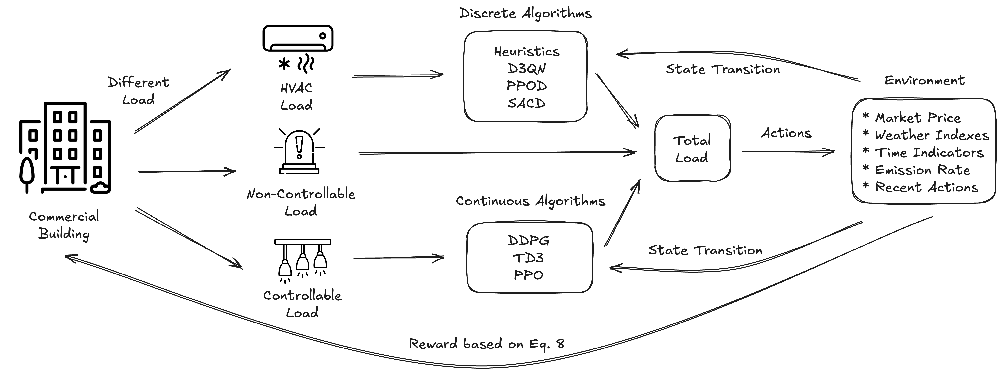

In [31]:
from IPython.display import Image, display

# Provide the path to your image file
image_path = 'figures/p3_method.png'

# Display the image
display(Image(filename=image_path))

In [32]:
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
def hvac_alg_comparision(alg_name):
    with open(r'res/agg_res.pkl', 'rb') as f:
        res = pickle.load(f)
    # temperatures

    # Assuming `res` is your dictionary and `res['db']` is a dataframe
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=res['db'].index, y=res['db']['Des Temp [°C]'], name='desired indoor temperature'))
    fig.add_trace(go.Scatter(x=res['db'].index, y=res['agg_main_Tin'], name='indoor temperature'))
    fig.add_trace(go.Scatter(x=res['db'].index, y=res['db']['Temp [°C]'], name='outdoor temperature'))

    fig.update_layout(xaxis_title='Time', yaxis_title='Temperature [°C]')

    # Identify each unique day in the data
    unique_days = res['db'].index.normalize().unique()

    for day in unique_days:
        # Green shade from 6:00 to 9:00 AM
        start_morning = pd.Timestamp(day) + pd.Timedelta(hours=6)
        end_morning = pd.Timestamp(day) + pd.Timedelta(hours=9)
        fig.add_shape(
            type="rect",
            xref="x",
            yref="paper",
            x0=start_morning,
            x1=end_morning,
            y0=0,
            y1=1,
            fillcolor="green",
            opacity=0.15,
            layer="below",
            line_width=0
        )

        # Purple shade from 4:00 to 8:00 PM
        start_evening = pd.Timestamp(day) + pd.Timedelta(hours=16)
        end_evening = pd.Timestamp(day) + pd.Timedelta(hours=20)
        fig.add_shape(
            type="rect",
            xref="x",
            yref="paper",
            x0=start_evening,
            x1=end_evening,
            y0=0,
            y1=1,
            fillcolor="purple",
            opacity=0.15,
            layer="below",
            line_width=0
        )

    # Save the figure as an image and then show it
    pio.write_image(fig, f'figures/temperature_{alg_name}.png', scale=2, width=1200, height=400)
    fig.show()

    print(f'Algorithm name: {alg_name}')
    print(f'total cost: {res["agg_total_cost"]} (change %: {100*(56820.615629782995-res["agg_total_cost"])/56820.615629782995})')
    print(f'Average indoor temperature: {res["agg_main_Tin"].mean()} (change %: {100*(res["agg_main_Tin"].mean()-res["agg_ref_Tin"].mean())/res["agg_ref_Tin"].mean()})')

    main_load_peak_hours = res['agg_load_total'] * res['db']['peak']
    ref_load_peak_hours = res['agg_ref_total_load'] * res['db']['peak']
    diff_load_peak_hours = ref_load_peak_hours - main_load_peak_hours
    shaved_peak = ref_load_peak_hours.max()-main_load_peak_hours.max()
    print(f'total saved consumption during peak hours: {diff_load_peak_hours.sum()} (change %: {100*(diff_load_peak_hours.sum())/ref_load_peak_hours.sum()})')
    print(f'peak load shaved: {shaved_peak} (change %: {100*shaved_peak/ref_load_peak_hours.max()})')
    print(f'cost components: {res["agg_cost_components"].sum(axis=0)}')
    print(f'cost components (change %): {[None, 100*(49870.05230516-res["agg_cost_components"].sum(axis=0)[1])/49870.05230516, 100*(13227.94980496-res["agg_cost_components"].sum(axis=0)[2])/13227.94980496, 100*(2637.83655794-res["agg_cost_components"].sum(axis=0)[3])/2637.83655794]}')

In [33]:
# Status Quo (OR Model)
hvac_alg_comparision('OR_model')

Algorithm name: OR_model
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [34]:
# turn hvac off
hvac_alg_comparision('HVAC_OFF')

Algorithm name: HVAC_OFF
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [35]:
# hueristic 0
hvac_alg_comparision('Heuristic_0')

Algorithm name: Heuristic_0
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [36]:
# hueristic -1
hvac_alg_comparision('Heuristic_1')

Algorithm name: Heuristic_1
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [37]:
# hueristic -2
hvac_alg_comparision('Heuristic_2')

Algorithm name: Heuristic_2
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [38]:
# CTRL Only TD3
hvac_alg_comparision('Controllable_Only')

Algorithm name: Controllable_Only
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [39]:
# heuristic 2 and peak
hvac_alg_comparision('Heuristic-2_peak')

Algorithm name: Heuristic-2_peak
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [40]:
# heuristic 2 and peak and TD3
hvac_alg_comparision('Heuristic-2_peak_TD3')

Algorithm name: Heuristic-2_peak_TD3
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [41]:
# d3qn
hvac_alg_comparision('DDPG')

Algorithm name: DDPG
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [42]:
# ppod
hvac_alg_comparision('PPOD')

Algorithm name: PPOD
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [43]:
# sacd
hvac_alg_comparision('SACD')

Algorithm name: SACD
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [44]:
import pickle
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio

with open(r'res/agg_res.pkl', 'rb') as f:
    res = pickle.load(f)

fig = go.Figure()

# Add reference controllable load as an area chart
fig.add_trace(go.Scatter(
    x=res['db'].index, 
    y=res['agg_ref_ctrl_load'], 
    name='Reference Controllable Load',
    fill='tozeroy',  # fills the area below the line
    mode='none'
))

# Add new controllable load as a line chart
fig.add_trace(go.Scatter(
    x=res['db'].index, 
    y=res['agg_load_ctrl'], 
    name='New Controllable Load',
    mode='lines'
))

# Update layout to add axis labels
fig.update_layout(
    xaxis_title='Time',
    yaxis_title='Load [kWh]'
)

# Identify each unique day in the data
unique_days = res['db'].index.normalize().unique()

for day in unique_days:
    # Green shade from 6:00 to 9:00 AM
    start_morning = pd.Timestamp(day) + pd.Timedelta(hours=6)
    end_morning = pd.Timestamp(day) + pd.Timedelta(hours=9)
    fig.add_shape(
        type="rect",
        xref="x",
        yref="paper",
        x0=start_morning,
        x1=end_morning,
        y0=0,
        y1=1,
        fillcolor="green",
        opacity=0.15,
        layer="below",
        line_width=0
    )

    # Purple shade from 4:00 to 8:00 PM
    start_evening = pd.Timestamp(day) + pd.Timedelta(hours=16)
    end_evening = pd.Timestamp(day) + pd.Timedelta(hours=20)
    fig.add_shape(
        type="rect",
        xref="x",
        yref="paper",
        x0=start_evening,
        x1=end_evening,
        y0=0,
        y1=1,
        fillcolor="purple",
        opacity=0.15,
        layer="below",
        line_width=0
    )

pio.write_image(fig, 'figures/controllable_load.png', scale=2, width=1200, height=400)
fig.show()

In [45]:
import plotly.graph_objs as go
import plotly.io as pio
import pandas as pd

# Assuming res is already loaded and available
# res = ... (your data loading step)

trace_nonreducible = go.Scatter(
    x=res['db'].index,
    y=res['agg_total_nonreducible'],
    mode='lines',
    name='Non-Reducible',
    stackgroup='one'
)

trace_ctrl = go.Scatter(
    x=res['db'].index,
    y=res['agg_load_ctrl'],
    mode='lines',
    name='Controllable',
    stackgroup='one'
)

trace_hvac = go.Scatter(
    x=res['db'].index,
    y=res['agg_load_hvac'],
    mode='lines',
    name='HVAC',
    stackgroup='one'
)

# Combine traces into a figure
fig = go.Figure(data=[trace_nonreducible, trace_ctrl, trace_hvac])

# Update layout
fig.update_layout(
    xaxis_title='Time',
    yaxis_title='Load [kWh]',
    template='plotly_white'
)

# Identify each unique day in the data
unique_days = res['db'].index.normalize().unique()

for day in unique_days:
    # Green shade from 6:00 to 9:00 AM
    start_morning = pd.Timestamp(day) + pd.Timedelta(hours=6)
    end_morning = pd.Timestamp(day) + pd.Timedelta(hours=9)
    fig.add_shape(
        type="rect",
        xref="x",
        yref="paper",
        x0=start_morning,
        x1=end_morning,
        y0=0,
        y1=1,
        fillcolor="green",
        opacity=0.15,
        layer="below",
        line_width=0
    )

    # Purple shade from 4:00 to 8:00 PM
    start_evening = pd.Timestamp(day) + pd.Timedelta(hours=16)
    end_evening = pd.Timestamp(day) + pd.Timedelta(hours=20)
    fig.add_shape(
        type="rect",
        xref="x",
        yref="paper",
        x0=start_evening,
        x1=end_evening,
        y0=0,
        y1=1,
        fillcolor="purple",
        opacity=0.15,
        layer="below",
        line_width=0
    )

pio.write_image(fig, 'figures/total_load.png', scale=2, width=1200, height=400)
fig.show()

sens on temp
sens on alpha
sens on beta
sens on gamma
carbon footprint

In [46]:
import pickle
import numpy as np
import plotly.graph_objs as go
import itertools
import plotly.io as pio

# Define parameter values
C_values = [100, 150]
R_values = [1, 2]
h_values = [50, 80]
alpha_values = [0.2, 0.3]
beta_values = [0.2, 0.3]
gamma = 0.55132

new_time_steps = range(0, 200000, 50)
d3qn_ = np.zeros_like(new_time_steps, dtype=np.float64)
ppod_ = np.zeros_like(new_time_steps, dtype=np.float64)
sacd_ = np.zeros_like(new_time_steps, dtype=np.float64)
cc = 0
# Iterate over all combinations of parameters
for C, R, h, alpha in itertools.product(C_values, R_values, h_values, alpha_values):
    # Load the data for each algorithm
    with open(f'res/track/track_HVAC_D3QN_C_{C}_R_{R}_h_{h}_alpha_{alpha}_gamma_{gamma}.pkl', 'rb') as f:
        d3qn = pickle.load(f)
    best_results = []

    # Iterate over the new time steps
    current_best = float('-inf')
    for time_step in new_time_steps:
        # Find the best result up to the current time step
        for i, time in enumerate(d3qn[0]):
            if time <= time_step:
                current_best = max(current_best, d3qn[1][i])
            else:
                break
        best_results.append(current_best)
    d3qn_ += best_results

    with open(f'res/track/track_HVAC_PPOD_C_{C}_R_{R}_h_{h}_alpha_{alpha}_gamma_{gamma}.pkl', 'rb') as f:
        ppod = pickle.load(f)
    best_results = []

    # Iterate over the new time steps
    current_best = float('-inf')
    for time_step in new_time_steps:
        # Find the best result up to the current time step
        for i, time in enumerate(ppod[0]):
            if time <= time_step:
                current_best = max(current_best, ppod[1][i])
            else:
                break
        best_results.append(current_best)
    ppod_ += best_results
    with open(f'res/track/track_HVAC_SACD_C_{C}_R_{R}_h_{h}_alpha_{alpha}_gamma_{gamma}.pkl', 'rb') as f:
        sacd = pickle.load(f)
    best_results = []

    # Iterate over the new time steps
    current_best = float('-inf')
    for time_step in new_time_steps:
        # Find the best result up to the current time step
        for i, time in enumerate(sacd[0]):
            if time <= time_step:
                current_best = max(current_best, sacd[1][i])
            else:
                break
        best_results.append(current_best)
    sacd_ += best_results

    cc += 1

fig = go.Figure()

# Add traces for each algorithm
fig.add_trace(go.Scatter(x=list(new_time_steps), y=d3qn_/cc, mode='lines', name='D3QN'))
fig.add_trace(go.Scatter(x=list(new_time_steps), y=ppod_/cc, mode='lines', name='PPOD'))
fig.add_trace(go.Scatter(x=list(new_time_steps), y=sacd_/cc, mode='lines', name='SACD'))

# Update layout
fig.update_layout(xaxis_title='Elapsed Time',yaxis_title='Average Best Reward Obtained', title=f'HVAC Algorithms Performance')

# Show plot
fig.show()
pio.write_image(fig, f'figures/hvac_algs_performance.png', scale=2, width=1200, height=400)

In [47]:
import pickle
import numpy as np
import plotly.graph_objs as go
import itertools
import plotly.io as pio

# Define parameter values
beta_values = [0.2, 0.3]
gamma = 0.55132

new_time_steps = range(0, 100000, 50)
ddpg_ = np.zeros_like(new_time_steps, dtype=np.float64)
ppo_  = np.zeros_like(new_time_steps, dtype=np.float64)
td3_  = np.zeros_like(new_time_steps, dtype=np.float64)

# Iterate over all combinations of parameters
for beta in beta_values:
    # Load the data for each algorithm
    with open(f'res/track/track_CTRL_DDPG_beta_{beta}_gamma_{gamma}.pkl', 'rb') as f:
        ddpg = pickle.load(f)
    
    best_results = np.full(len(new_time_steps), float('-inf'), dtype=np.float64)

    # Iterate over the new time steps
    for idx, time_step in enumerate(new_time_steps):
        # Find the best result up to the current time step
        for i, time in enumerate(ddpg[0]):
            if time <= time_step:
                best_results[idx] = max(best_results[idx], ddpg[1][i].item())
            else:
                break
    
    # Add to ddpg_
    ddpg_ += best_results
    
    with open(f'res/track/track_CTRL_PPO_beta_{beta}_gamma_{gamma}.pkl', 'rb') as f:
        ppo = pickle.load(f)
    
    best_results = np.full(len(new_time_steps), float('-inf'), dtype=np.float64)

    # Iterate over the new time steps
    for idx, time_step in enumerate(new_time_steps):
        # Find the best result up to the current time step
        for i, time in enumerate(ppo[0]):
            if time <= time_step:
                best_results[idx] = max(best_results[idx], ppo[1][i].item())
            else:
                break
    
    ppo_ += best_results

    with open(f'res/track/track_CTRL_TD3_{beta}_{gamma}.pkl', 'rb') as f:
        td3 = pickle.load(f)
    
    best_results = np.full(len(new_time_steps), float('-inf'), dtype=np.float64)

    # Iterate over the new time steps
    for idx, time_step in enumerate(new_time_steps):
        # Find the best result up to the current time step
        for i, time in enumerate(td3[0]):
            if time <= time_step:
                best_results[idx] = max(best_results[idx], td3[1][i].item())
            else:
                break
    
    # Add to ddpg_
    td3_ += best_results

    cc += 1

import plotly.graph_objects as go
import plotly.io as pio

fig = go.Figure()

# Add traces for each algorithm
fig.add_trace(go.Scatter(x=list(new_time_steps), y=ddpg_/cc, mode='lines', name='DDPG'))
fig.add_trace(go.Scatter(x=list(new_time_steps), y=ppo_/cc, mode='lines', name='PPO'))
fig.add_trace(go.Scatter(x=list(new_time_steps), y=td3_/cc, mode='lines', name='TD3'))

# Update layout
fig.update_layout(
    xaxis_title='Elapsed Time',
    yaxis_title='Average Best Reward Obtained',
    title='CTRL Algorithms Performance',
    yaxis=dict(range=[-10, -5])
)

# Show plot
fig.show()

# Save plot as image
pio.write_image(fig, 'figures/ctrl_algs_performance.png', scale=2, width=1200, height=400)

In [48]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

algorithms = ["Heuristic_0", "Heuristic_1", "Heuristic_2", "TD3", "Heuristic_2_peak", "Heuristic_2_peak_TD3", "D3QN_TD3", "PPOD_TD3", "SACD_TD3"]
# total_cost_change = [-6.0366426412441285, 11.162125606943738, 27.85371431635701, 10.63180851576139, 37.7504987896538, 48.382307305415175, 49.90187926606712, 66.79415288678616, 63.766719557467674]
total_saved_consumption_peak_hours = [-5319.999999999993, 8680.0, 23440.00000000001, 10048.680767867318, 36640.00000000001, 46688.680767867336, 48308.68076786732, 65068.68076786735, 61568.680767867336]
peak_load_shaved_change = [4.128990444224641, 7.935176024146247, 3.8396871516776523, 0.0, 11.483524741067322, 11.483524741067322, 24.40339023382219, 27.07334026325346, 20.60773637643016]
total_cost_change = [-0.9966604989394381, 3.121975645236912, 5.822554852250698, 1.0046487699526807, 2.505914788191865, 3.5105635581463694, 3.450992220947652, 4.169200140538759, 4.589118979241064]
dissatisfaction_change = [-42.935665189834275, -38.18746836546275, -266.06977577530796, -32.82375207504142, -84.3846402919376, -117.2083923669498, -220.2205607964661, -138.6004530303827, -176.518830309146]
co2_emission_change = [-1.7164074576099708, 1.5595132158382925, 4.889953628035079, 0.7869537368410208, 1.3331944604667283, 2.1201481972100535, 1.1836251454321012, 1.5564150264832823, 2.5659645177071626]
dissatisfaction_change = -np.array(dissatisfaction_change)

# Define colors for algorithms
colors = px.colors.qualitative.Plotly

# Create subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=(
    'Total Cost decrease (%)',
    # 'Total Saved Consumption During Peak Hours (kWh)',
    'Peak Load Shaved (Ratio %)',
    'Dissatisfaction increase (%)',
    'CO2 Emission decrease (%)'
))

# Total Cost Change (%)
fig.add_trace(go.Bar(
    x=algorithms,
    y=total_cost_change,
    marker_color=colors[:len(algorithms)],
    showlegend=False
), row=1, col=1)

# # Total Saved Consumption During Peak Hours
# fig.add_trace(go.Bar(
#     x=algorithms,
#     y=total_saved_consumption_peak_hours,
#     marker_color=colors[:len(algorithms)],
#     showlegend=False
# ), row=1, col=2)

# Peak Load Shaved Change (%)
fig.add_trace(go.Bar(
    x=algorithms,
    y=peak_load_shaved_change,
    marker_color=colors[:len(algorithms)],
    showlegend=False
), row=1, col=2)

# Dissatisfaction Change (%)
fig.add_trace(go.Bar(
    x=algorithms,
    y=dissatisfaction_change,
    marker_color=colors[:len(algorithms)],
    showlegend=False
), row=2, col=1)

# CO2 Emission Change (%)
fig.add_trace(go.Bar(
    x=algorithms,
    y=co2_emission_change,
    marker_color=colors[:len(algorithms)],
    showlegend=False
), row=2, col=2)

# Update layout
fig.update_layout(height=800, width=1200)

# Hide unused subplot
# fig.update_xaxes(visible=False, row=2, col=2)
# fig.update_yaxes(visible=False, row=2, col=2)

pio.write_image(fig, f'figures/algs_comparison.png', scale=2, width=1200, height=800)

# Show the plot
fig.show()


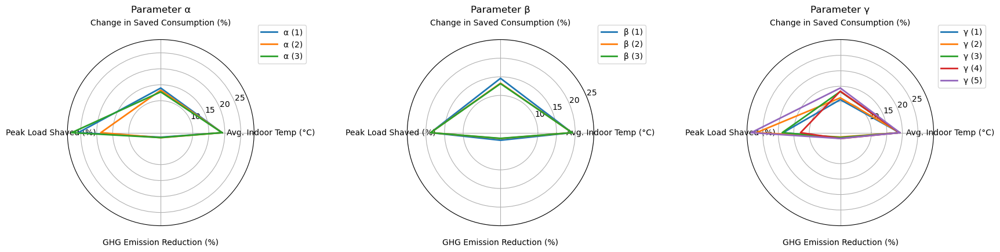

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the star plot
categories = ['Avg. Indoor Temp (°C)', 'Change in Saved Consumption (%)',
              'Peak Load Shaved (%)', 'GHG Emission Reduction (%)']

# Values for each parameter
alpha_values = [[19.18, 13.97, 25.77, 1.42],
                [19.15, 13.29, 18.73, 1.58],
                [19.14, 12.77, 27.83, 1.55]]

beta_values = [[19.15, 14.60, 18.73, 2.04],
               [19.15, 13.29, 18.73, 1.58],
               [19.15, 13.17, 18.73, 1.53]]

gamma_values = [[19.08, 10.68, 18.44, 1.75],
                [19.17, 11.26, 27.04, 1.41],
                [19.15, 13.29, 18.73, 1.58],
                [19.11, 13.40, 12.81, 1.91],
                [19.18, 14.43, 28.72, 1.89]]

parameter_groups = [('α', alpha_values), ('β', beta_values), ('γ', gamma_values)]

# Create a 1×3 layout
fig, axs = plt.subplots(1, 3, figsize=(18, 6), subplot_kw=dict(polar=True))

for idx, (parameter, values) in enumerate(parameter_groups):
    num_vars = len(categories)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    ax = axs[idx]

    for value_set in values:
        stats = value_set + value_set[:1]
        ax.plot(angles, stats, label=f'{parameter} ({values.index(value_set)+1})', linewidth=2)
        # Removed ax.fill(angles, stats, alpha=0.25) to show only lines

    ax.set_yticks([10, 15, 20, 25])  # Adjust as necessary
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=10)  # Adjust font size for readability
    ax.set_title(f'Parameter {parameter}', va='bottom', fontsize=12)
    ax.tick_params(axis='x', pad=10)  # Add padding to prevent collision

    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.tight_layout(pad=3.0)  # Adjust spacing between plots

# Save the plot
file_path = "figures/Star_Diagrams_Parameters_LinesOnly.png"
plt.savefig(file_path, bbox_inches='tight', dpi=300)
plt.show()


## Sensitivity Analysis

In [50]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_alpha_0.1_0.2')

Algorithm name: HVAC_PPOD_CTRL_TD3_alpha_0.1_0.2
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [51]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_alpha_0.3_0.4')

Algorithm name: HVAC_PPOD_CTRL_TD3_alpha_0.3_0.4
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [52]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_beta_0.1_0.2')

Algorithm name: HVAC_PPOD_CTRL_TD3_beta_0.1_0.2
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [53]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_beta_0.3_0.4')

Algorithm name: HVAC_PPOD_CTRL_TD3_beta_0.3_0.4
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [54]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_gamma_0.35132')

Algorithm name: HVAC_PPOD_CTRL_TD3_gamma_0.35132
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [55]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_gamma_0.45132')

Algorithm name: HVAC_PPOD_CTRL_TD3_gamma_0.45132
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [56]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_gamma_0.55132')

Algorithm name: HVAC_PPOD_CTRL_TD3_gamma_0.55132
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [57]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_gamma_0.65132')

Algorithm name: HVAC_PPOD_CTRL_TD3_gamma_0.65132
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


In [58]:
hvac_alg_comparision('HVAC_PPOD_CTRL_TD3_gamma_0.75132')

Algorithm name: HVAC_PPOD_CTRL_TD3_gamma_0.75132
total cost: 1220.7162082551222 (change %: 97.85163149901658)
Average indoor temperature: 19.184766644373575 (change %: -1.6047024882816012)
total saved consumption during peak hours: 71037.54260669986 (change %: 14.430037086214092)
peak load shaved: 652.2311111111119 (change %: 28.71742206970835)
cost components: [53371.92638003 47642.08005945 34315.24293025  2587.85585376]
cost components (change %): [None, 4.467555462105602, -159.41467450519093, 1.8947612213757674]


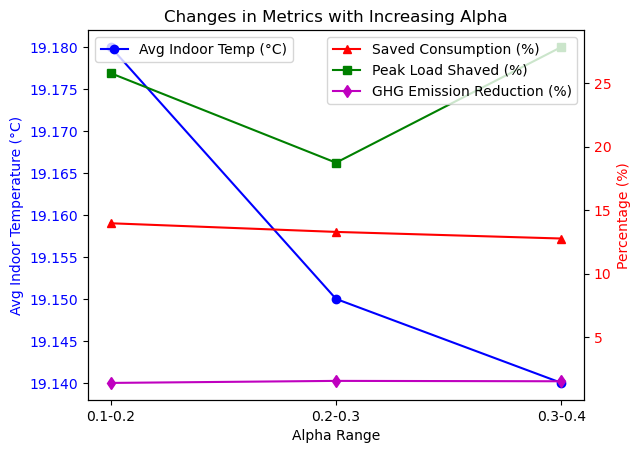

In [59]:
import matplotlib.pyplot as plt

# Data for the different alpha ranges
alpha_ranges = ['0.1-0.2', '0.2-0.3', '0.3-0.4']
avg_temp = [19.18, 19.15, 19.14]
saved_consumption = [13.97, 13.29, 12.77]
peak_load_shaved = [25.77, 18.73, 27.83]
ghg_reduction = [1.42, 1.58, 1.55]

# Create subplots
fig, ax1 = plt.subplots()

# Plot average indoor temperature
ax1.plot(alpha_ranges, avg_temp, 'bo-', label='Avg Indoor Temp (°C)')
ax1.set_xlabel('Alpha Range')
ax1.set_ylabel('Avg Indoor Temperature (°C)', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create a twin y-axis to plot other metrics
ax2 = ax1.twinx()
ax2.plot(alpha_ranges, saved_consumption, 'r^-', label='Saved Consumption (%)')
ax2.plot(alpha_ranges, peak_load_shaved, 'gs-', label='Peak Load Shaved (%)')
ax2.plot(alpha_ranges, ghg_reduction, 'md-', label='GHG Emission Reduction (%)')
ax2.set_ylabel('Percentage (%)', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Add a title
plt.title('Changes in Metrics with Increasing Alpha')

# Show plot
plt.show()


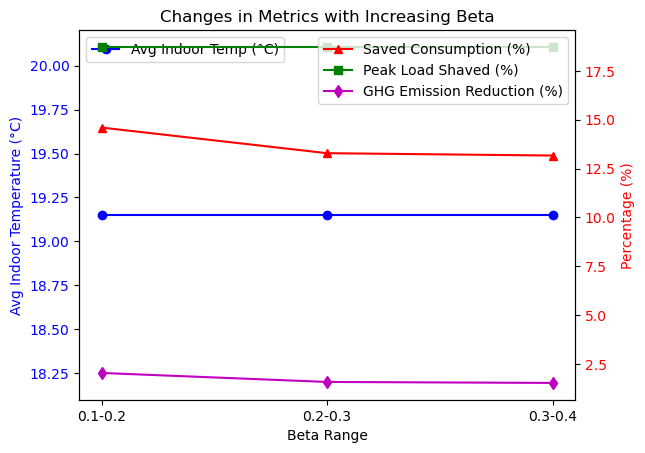

In [60]:
# Data for the different beta ranges
beta_ranges = ['0.1-0.2', '0.2-0.3', '0.3-0.4']
avg_temp_beta = [19.15, 19.15, 19.15]
saved_consumption_beta = [14.60, 13.29, 13.17]
peak_load_shaved_beta = [18.73, 18.73, 18.73]
ghg_reduction_beta = [2.04, 1.58, 1.53]

# Create subplots for beta data
fig, ax1 = plt.subplots()

# Plot average indoor temperature for beta
ax1.plot(beta_ranges, avg_temp_beta, 'bo-', label='Avg Indoor Temp (°C)')
ax1.set_xlabel('Beta Range')
ax1.set_ylabel('Avg Indoor Temperature (°C)', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create a twin y-axis to plot other metrics
ax2 = ax1.twinx()
ax2.plot(beta_ranges, saved_consumption_beta, 'r^-', label='Saved Consumption (%)')
ax2.plot(beta_ranges, peak_load_shaved_beta, 'gs-', label='Peak Load Shaved (%)')
ax2.plot(beta_ranges, ghg_reduction_beta, 'md-', label='GHG Emission Reduction (%)')
ax2.set_ylabel('Percentage (%)', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Add a title
plt.title('Changes in Metrics with Increasing Beta')

# Show plot
plt.show()


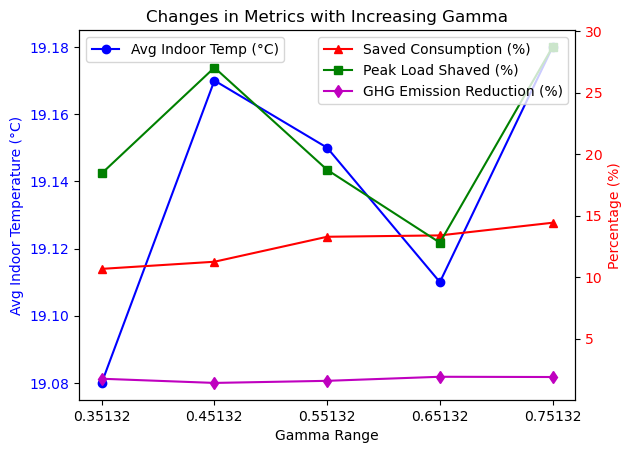

In [61]:
# Data for the different gamma ranges
gamma_ranges = ['0.35132', '0.45132', '0.55132', '0.65132', '0.75132']
avg_temp_gamma = [19.08, 19.17, 19.15, 19.11, 19.18]
saved_consumption_gamma = [10.68, 11.26, 13.29, 13.40, 14.43]
peak_load_shaved_gamma = [18.44, 27.04, 18.73, 12.81, 28.72]
ghg_reduction_gamma = [1.75, 1.41, 1.58, 1.91, 1.89]

# Create subplots for gamma data
fig, ax1 = plt.subplots()

# Plot average indoor temperature for gamma
ax1.plot(gamma_ranges, avg_temp_gamma, 'bo-', label='Avg Indoor Temp (°C)')
ax1.set_xlabel('Gamma Range')
ax1.set_ylabel('Avg Indoor Temperature (°C)', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create a twin y-axis to plot other metrics
ax2 = ax1.twinx()
ax2.plot(gamma_ranges, saved_consumption_gamma, 'r^-', label='Saved Consumption (%)')
ax2.plot(gamma_ranges, peak_load_shaved_gamma, 'gs-', label='Peak Load Shaved (%)')
ax2.plot(gamma_ranges, ghg_reduction_gamma, 'md-', label='GHG Emission Reduction (%)')
ax2.set_ylabel('Percentage (%)', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Add a title
plt.title('Changes in Metrics with Increasing Gamma')

# Show plot
plt.show()
